In [75]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import numpy as np
import plotly.graph_objs as go
import plotly.io as pio


In [81]:
def deltaG0(G0:float, Vp:float, tp:float) -> float:
    """Parameters:

    G0 (µS): float
        Conductance state of the RRAM device

    Vp (V): float
        Voltage applied on the device. Vp > 0 => SET, Vp < 0 => RESET

    tp (s): float
        time for which voltage pulse is applied

    Attributes:

    data: Dict
        Contains c and d coeffecients for all input ranges
    index: int
        index of the input range in which G0 belongs to
    
    c, d: List[float]
        coffecients of the equations
    
    D_m, D_d2d: float
        values calculated according to the paper

    Returns:
    deltaG0: float
        Represents the change in conductance value og the RRAM device

    """
    data = {
    "SET": {
        "G0 range (in µs)": [
            "3.16 - 5.62",
            "5.62 - 10",
            "10 - 17.8",
            "17.8 - 31.6",
            "31.6 - 56.2",
            "56.2 - 100",
            "100 - 178",
            "178 - 300",
        ],
        "c0": [
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
        ],
        "c1": [
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
        ],
        "c2": [
            -3.851,
            -3.769,
            -3.729,
            -3.517,
            -3.426,
            -3.373,
            -3.422,
            -3.572,
        ],
        "c3": [
            9.369,
            7.512,
            6.801,
            6.180,
            5.946,
            5.005,
            4.936,
            4.864,
        ],
        "c4": [
            10.4,
            8.419,
            7.582,
            6.851,
            6.558,
            5.792,
            5.840,
            5.785,
        ],
        "d0": [
            -1.26,
            -1.22,
            -1.03,
            -0.78,
            -0.37,
            0.14,
            0.34,
            0.26,
        ],
        "d1": [
            -0.02,
            -0.02,
            -0.02,
            -0.01,
            5e-3,
            0.01,
            0.01,
            0.01,
        ],
        "d2": [
            0.82,
            0.84,
            0.72,
            0.53,
            0.15,
            -0.29,
            -0.41,
            -0.29,
        ],
        "d3": [
            -0.57,
            -0.57,
            -0.47,
            -0.33,
            -0.01,
            0.31,
            0.37,
            0.25,
        ],
        "d4": [
            0.94,
            0.81,
            0.63,
            0.45,
            0.11,
            -0.21,
            -0.29,
            -0.20,
        ],
    },
    "RESET": {
        "G0 range (in µs)": [
            "3.16 - 5.62",
            "5.62 - 10",
            "10 - 17.8",
            "17.8 - 31.6",
            "31.6 - 56.2",
            "56.2 - 100",
            "100 - 178",
            "178 - 300",
        ],
        "c0": [
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
        ],
        "c1": [
            0.89,
            0.51,
            0.34,
            0.25,
            0.23,
            0.21,
            0.22,
            0.28,
        ],
        "c2": [
            8.96,
            6.88,
            4.83,
            3.63,
            2.91,
            2.33,
            1.93,
            1.68,
        ],
        "c3": [
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
        ],
        "c4": [
            -10.90,
            -8.61,
            -8.14,
            -7.77,
            -7.42,
            -7.30,
            -7.10,
            -7.00,
        ],
        "d0": [
            0.04,
            -5e-3,
            -0.07,
            -0.11,
            -0.15,
            -0.12,
            -0.04,
            0.10,
        ],
        "d1": [
            2e-4,
            -4e-4,
            -3e-3,
            -4e-3,
            -6e-3,
            -5e-3,
            -2e-3,
            3e-3,
        ],
        "d2": [
            0.02,
            -2e-3,
            -0.07,
            -0.11,
            -0.17,
            -0.16,
            -0.10,
            0.02,
        ],
        "d3": [
            5e-3,
            -0.01,
            -0.05,
            -0.09,
            -0.13,
            -0.13,
            -0.11,
            -0.05,
        ],
        "d4": [
            0.03,
            0.02,
            -0.02,
            -0.03,
            -0.03,
            -0.06,
            -0.04,
            -4e-3,
        ],
    },
}


    index = next((i for i, r in enumerate(data['SET' if Vp>=0 else "RESET"]['G0 range (in µs)']) if float(r.split(' - ')[0]) <= G0 < float(r.split(' - ')[1])), None)
    if not isinstance(index, int):
        raise ValueError(f"G0 out of bounds  ")
    c = [data['SET' if Vp>=0 else 'RESET'][f"c{i}"][index] for i in range(5)]
    d = [data['SET' if Vp>=0 else 'RESET'][f"d{i}"][index] for i in range(5)]

    sign = np.sign(Vp)

    D_m = c[0] * (sign - np.tanh(c[1]*(np.log(tp) - c[2])) ) * (np.tanh(c[3]*Vp - c[4]) + sign)
    D_d2d = D_m * (d[0] + d[1]* (np.log(tp)**2) + d[2]*Vp*np.log(tp) + d[3]*(Vp**2)*np.log(tp) + d[4]*(Vp**3))

    return D_m + D_d2d





# deltaG0(G0=8.9, Vp=5.3, tp=100e-6)

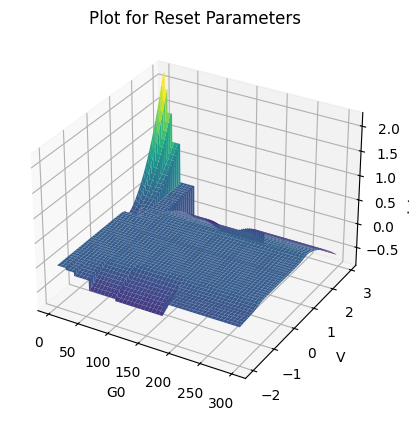

In [82]:
x = np.arange(3.16, 300, 0.1)
y = np.arange(-2, 3, 0.1)
z = np.zeros((len(x), len(y)))

for i in range(len(x)):
    for j in range(len(y)):
        z[i, j] = deltaG0(x[i], y[j], 10e-6)

# Create meshgrid for X1 and Y1
X, Y = np.meshgrid(x, y)

# Transpose Z1 to match the shape of X1, Y1
Z = z.T

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')
ax.set_xlabel('G0')
ax.set_ylabel('V')
ax.set_zlabel('deltaG/G0')
ax.set_title('Plot for Reset Parameters')
plt.show()

In [83]:

# Define G0 and V ranges
x = np.arange(3.16, 300, 0.1)  # G0 range
y = np.arange(-2, 3, 0.1)      # V range
z = np.zeros((len(x), len(y)))  # Initialize Z

# Compute deltaG0 for each point in the meshgrid
for i in range(len(x)):
    for j in range(len(y)):
        z[i, j] = deltaG0(x[i], y[j], 10e-6)

# Create meshgrid for G0 and V
X, Y = np.meshgrid(x, y)

# Transpose Z to match the shape of X, Y
Z = z.T

# Create the surface plot
surface = go.Surface(x=X, y=Y, z=Z, colorscale='Viridis')

# Layout
layout = go.Layout(
    title='Plot for Reset Parameters (G0, V, deltaG)',
    scene=dict(
        xaxis=dict(title='G0'),
        yaxis=dict(title='V'),
        zaxis=dict(title='deltaG')
    )
)

# Create figure and plot
fig = go.Figure(data=[surface], layout=layout)
pio.show(fig)

In [84]:
data = {
    "SET": {
        "G0 range (in µs)": [
            "3.16 - 5.62",
            "5.62 - 10",
            "10 - 17.8",
            "17.8 - 31.6",
            "31.6 - 56.2",
            "56.2 - 100",
            "100 - 178",
            "178 - 300",
        ],
        "c0": [1.55e-4] * 8,
        "c1": [-0.47] * 8,
        "c2": [-3.851, -3.769, -3.729, -3.517, -3.426, -3.373, -3.422, -3.572],
        "c3": [9.369, 7.512, 6.801, 6.180, 5.946, 5.005, 4.936, 4.864],
        "c4": [10.4, 8.419, 7.582, 6.851, 6.558, 5.792, 5.840, 5.785],
        "d0": [-1.26, -1.22, -1.03, -0.78, -0.37, 0.14, 0.34, 0.26],
        "d1": [-0.02, -0.02, -0.02, -0.01, 5e-3, 0.01, 0.01, 0.01],
        "d2": [0.82, 0.84, 0.72, 0.53, 0.15, -0.29, -0.41, -0.29],
        "d3": [-0.57, -0.57, -0.47, -0.33, -0.01, 0.31, 0.37, 0.25],
        "d4": [0.94, 0.81, 0.63, 0.45, 0.11, -0.21, -0.29, -0.20],
    },
    "RESET": {
        "G0 range (in µs)": [
            "3.16 - 5.62",
            "5.62 - 10",
            "10 - 17.8",
            "17.8 - 31.6",
            "31.6 - 56.2",
            "56.2 - 100",
            "100 - 178",
            "178 - 300",
        ],
        "c0": [1.55e-4] * 8,
        "c1": [-0.47] * 8,
        "c2": [-3.851, -3.769, -3.729, -3.517, -3.426, -3.373, -3.422, -3.572],
        "c3": [9.369, 7.512, 6.801, 6.180, 5.946, 5.005, 4.936, 4.864],
        "c4": [10.4, 8.419, 7.582, 6.851, 6.558, 5.792, 5.840, 5.785],
        "d0": [0.04, 0.04, 0.34, 0.25, 0.21, 0.22, 0.26, 0.28],
        "d1": [2e-4, 2e-4, 0.01, -0.11, -0.07, -0.3, -0.32, -0.24],
        "d2": [0.02, 0.02, -0.15, -0.11, -0.15, -0.16, -0.15, -0.17],
        "d3": [5e-3, 5e-3, -0.17, -0.09, -0.07, -0.16, -0.13, -0.13],
        "d4": [0.03, 0.02, -0.06, -0.03, -0.02, -0.06, -0.04, -0.04],
    },
}



In [85]:
value = 8.69

index = next((i for i, r in enumerate(data['RESET']['G0 range (in µs)']) if float(r.split(' - ')[0]) <= value < float(r.split(' - ')[1])), None)

print(index) 

1


In [86]:
data = {
    "SET": {
        "G0 range (in µs)": [
            "3.16 - 5.62",
            "5.62 - 10",
            "10 - 17.8",
            "17.8 - 31.6",
            "31.6 - 56.2",
            "56.2 - 100",
            "100 - 178",
            "178 - 300",
        ],
        "c0": [
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
            1.55e-4,
        ],
        "c1": [
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
            -0.47,
        ],
        "c2": [
            -3.851,
            -3.769,
            -3.729,
            -3.517,
            -3.426,
            -3.373,
            -3.422,
            -3.572,
        ],
        "c3": [
            9.369,
            7.512,
            6.801,
            6.180,
            5.946,
            5.005,
            4.936,
            4.864,
        ],
        "c4": [
            10.4,
            8.419,
            7.582,
            6.851,
            6.558,
            5.792,
            5.840,
            5.785,
        ],
        "d0": [
            -1.26,
            -1.22,
            -1.03,
            -0.78,
            -0.37,
            0.14,
            0.34,
            0.26,
        ],
        "d1": [
            -0.02,
            -0.02,
            -0.02,
            -0.01,
            5e-3,
            0.01,
            0.01,
            0.01,
        ],
        "d2": [
            0.82,
            0.84,
            0.72,
            0.53,
            0.15,
            -0.29,
            -0.41,
            -0.29,
        ],
        "d3": [
            -0.57,
            -0.57,
            -0.47,
            -0.33,
            -0.01,
            0.31,
            0.37,
            0.25,
        ],
        "d4": [
            0.94,
            0.81,
            0.63,
            0.45,
            0.11,
            -0.21,
            -0.29,
            -0.20,
        ],
    },
    "RESET": {
        "G0 range (in µs)": [
            "3.16 - 5.62",
            "5.62 - 10",
            "10 - 17.8",
            "17.8 - 31.6",
            "31.6 - 56.2",
            "56.2 - 100",
            "100 - 178",
            "178 - 300",
        ],
        "c0": [
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
            -0.89e-4,
        ],
        "c1": [
            0.89,
            0.51,
            0.34,
            0.25,
            0.21,
            0.23,
            0.22,
            0.28,
        ],
        "c2": [
            8.96,
            6.88,
            4.83,
            3.63,
            2.91,
            2.33,
            1.93,
            1.68,
        ],
        "c3": [
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
            6.2,
        ],
        "c4": [
            -10.90,
            -8.61,
            -8.14,
            -7.77,
            -7.42,
            -7.30,
            -7.10,
            -7.00,
        ],
        "d0": [
            0.04,
            -5e-3,
            -0.07,
            -0.11,
            -0.15,
            -0.12,
            -0.04,
            0.10,
        ],
        "d1": [
            2e-4,
            2e-4,
            0.01,
            -0.11,
            -0.07,
            -0.3,
            -0.32,
            -0.24,
        ],
        "d2": [
            0.02,
            -2e-3,
            -0.07,
            -0.11,
            -0.17,
            -0.16,
            -0.10,
            0.02,
        ],
        "d3": [
            5e-3,
            -0.01,
            -0.05,
            -0.09,
            -0.13,
            -0.13,
            -0.11,
            -0.05,
        ],
        "d4": [
            0.03,
            0.02,
            -0.02,
            -0.03,
            -0.03,
            -0.06,
            -0.04,
            -4e-3,
        ],
    },
}

